In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,10)
import wave
import pyaudio
from audio2numpy import open_audio
from IPython.display import Audio
from scipy import signal

ModuleNotFoundError: No module named 'pyaudio'

In [2]:
def pan(inData, panValue, panType):
    
    panTransform = (panValue/200) + 0.5 # panValue is -100 to 100, need to convert to 0 to +1
    
    if panType == 1:
        leftAmp = 1-panTransform
        rightAmp = panTransform
    elif panType == 2:
        leftAmp = np.sqrt(1-panTransform)
        rightAmp = np.sqrt(panTransform)
    else:
        leftAmp = np.sin(1-panTransform) * np.pi/2
        rightAmp = np.sin(panTransform) * np.pi/2
    
    leftChannel = leftAmp * inData
    rightChannel = rightAmp * inData
    
    return [leftChannel, rightChannel]

In [3]:
framerate = 44100
t = np.linspace(0,1,framerate*1)

In [4]:
data = np.sin(2*np.pi*440*t)

[l,r] = pan(data, -75, 3)
Audio([l, r],rate=framerate)

### autopan

In [5]:
filename = "textbookcode-master\Ch_13\RhythmGuitar.wav"
[carrier,Fs] = open_audio(filename)

In [6]:
N = len(carrier)
Ts = 1/Fs

In [7]:
t = np.arange(0,N,1) * Ts
f = 1

In [8]:
panValue = 100 * np.sin(2*np.pi*f*t)
panType = 2

In [10]:
[outL, outR] = pan(carrier, panValue, panType)

In [11]:
Audio([outL, outR],rate=Fs)

### mid/side processing

In [42]:
filename = "textbookcode-master\Ch_13\stereoDrums.wav"
[carrier,Fs] = open_audio(filename)

In [43]:
carrier.shape

(939288, 2)

In [44]:
arr1 = np.array([[1,2,3], [4,5,6]])
arr1.shape

(2, 3)

In [45]:
arr1[0,:]

array([1, 2, 3])

In [46]:
arr1[1,:]

array([4, 5, 6])

In [51]:
left = carrier[:,0]
right = carrier[:,1]

In [52]:
mid = 0.5 * (left + right)
sides = 0.5 * (left - right)

In [53]:
newL = mid + sides
newR = mid - sides

In [54]:
output = [newL, newR]

In [64]:
Audio(output,rate=Fs)

In [61]:
Audio([left,right],rate=Fs)

### stereo widening

In [179]:
width = 1.5

In [180]:
sideNew = width * sides
midNew = (2 - width) * mid

In [181]:
# convert back to L & R channels
newLeft = midNew + sideNew
newRight = midNew - sideNew

In [182]:
output = [newLeft, newRight]

In [89]:
Audio(output,rate=Fs)

### Goniometer

In [90]:
Fs = 48000
Ts = 1/Fs
f = 10
t = np.linspace(0,1,Fs)
x = np.sin(2*np.pi*f*t)

In [112]:
r1 = 0.707*x
r2 = 0.707*x

In [119]:
panCenter = np.vstack([0.707*x,0.707*x]).T

In [120]:
panCenter.shape

(48000, 2)

In [174]:
def goniometer(inData):
    N = len(inData)
    x = np.zeros(N)
    y = np.zeros(N)
    
    for n in range(N):
        L = inData[n,0]
        R = inData[n,1]
        
        radius = np.linalg.norm([L,R])
        angle = np.arctan2(L,R)
        angle = angle + (np.pi/4); # Rotate by convention
        x[n] = radius * np.cos(angle)
        y[n] = radius * np.sin(angle)
        
    
    plt.axline((-1, -1) ,(1, 1),color='r')
    plt.axline((-1, 1) ,(1, -1),color='r')
    plt.axline((-1, 0) ,(1, 0),color='r')
    plt.axline((0, -1) ,(0, 1),color='r')
    
    # circle plot
    th = np.arange(0,2*np.pi,np.pi/50)
    xunit = np.cos(th)
    yunit = np.sin(th)
    plt.plot(xunit, yunit,color='r')
    
    #left
    xL = -0.75
    yL = 0.8
    txtL = 'L'
    plt.text(xL,yL,txtL,color='r')
    
    # Right
    xR = 0.73
    yR = 0.8
    txtR = 'R'
    plt.text(xR,yR,txtR,color='r')
    
    # Mid
    xM = -0.018
    yM = 0.96
    txtM = 'M'
    plt.text(xM,yM,txtM,color='r')
    
    # side
    xS = -0.98
    yS = 0
    txtS = 'S'
    plt.text(xS,yS,txtS,color='r')
    
    # Plot Data
    plt.plot(x,y,'.b')
    plt.axis([-1, 1, -1, 1])

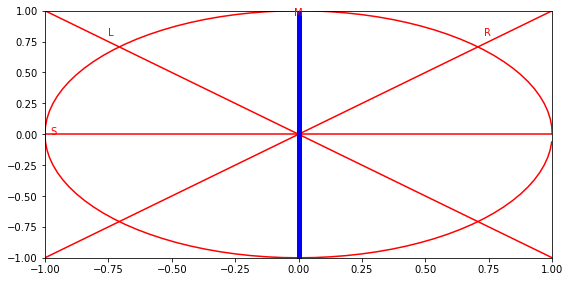

In [175]:
plt.subplot(2,2,1);
goniometer(panCenter);

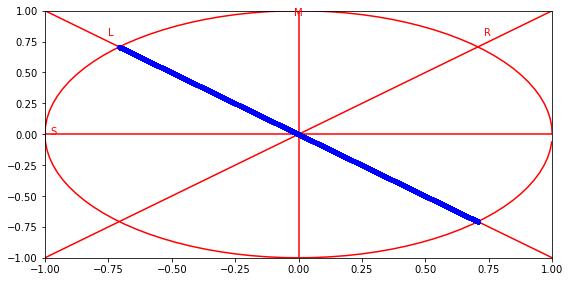

In [161]:
panLeft = np.vstack([x , np.zeros(len(x))]).T
plt.subplot(2,2,2)
goniometer(panLeft)

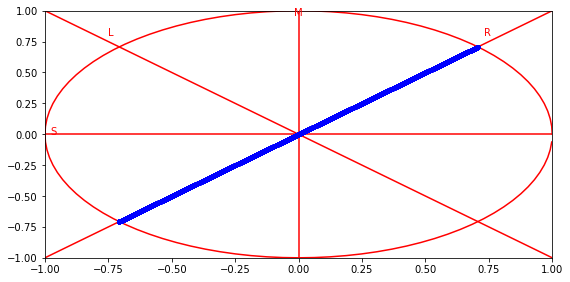

In [165]:
panRight = np.vstack([np.zeros(np.size(x)),x]).T
plt.subplot(2,2,3);
goniometer(panRight);


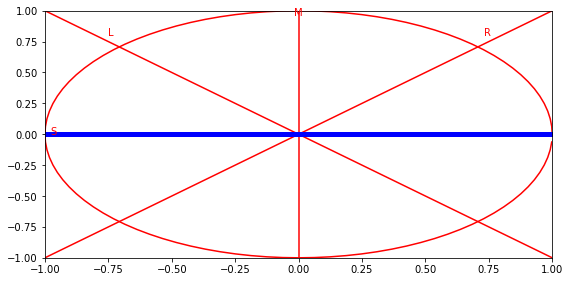

In [170]:
polarity = np.vstack([0.707 * x , 0.707 * (-x)]).T
plt.subplot(2,2,4)
goniometer(polarity)

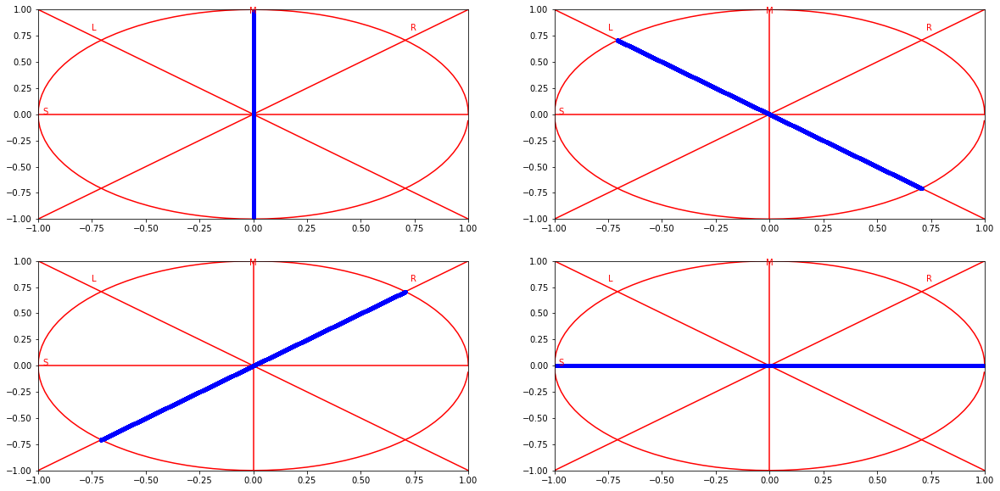

In [171]:
plt.subplot(2,2,1)
goniometer(panCenter)

panLeft = np.vstack([x , np.zeros(len(x))]).T
plt.subplot(2,2,2)
goniometer(panLeft)

panRight = np.vstack([np.zeros(np.size(x)),x]).T
plt.subplot(2,2,3)
goniometer(panRight)

polarity = np.vstack([0.707 * x , 0.707 * (-x)]).T
plt.subplot(2,2,4)
goniometer(polarity)

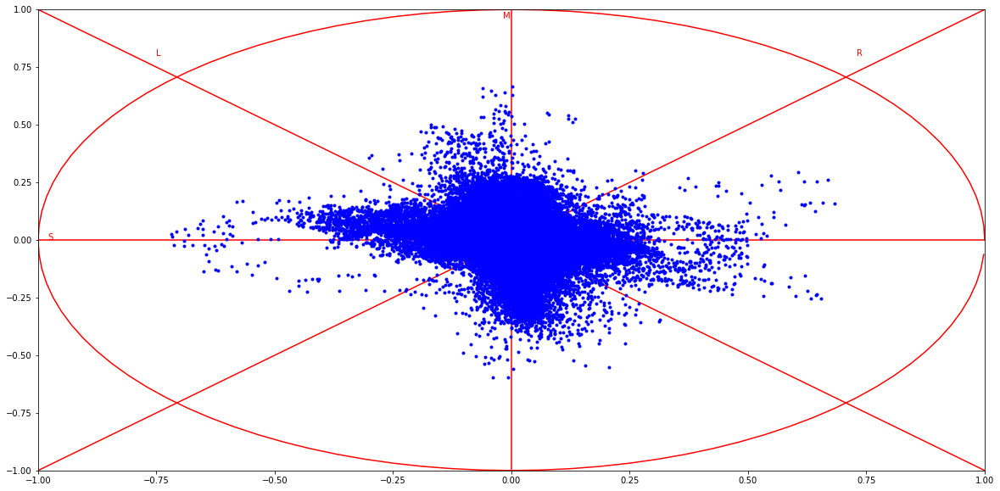

In [183]:
goniometer(np.array(output).T)